In [67]:
# Install necessary packages
# %pip install pandas
# %pip install matplotlib
# %pip install seaborn
# %pip install plotly
# %pip install plotly.express
# %pip install --upgrade nbformat


In [68]:
# Read the CSV file into a DataFrame
import pandas as pd
file_path = "tornado-data-cleaned.csv"
df = pd.read_csv(file_path)

In [69]:
#df.head()

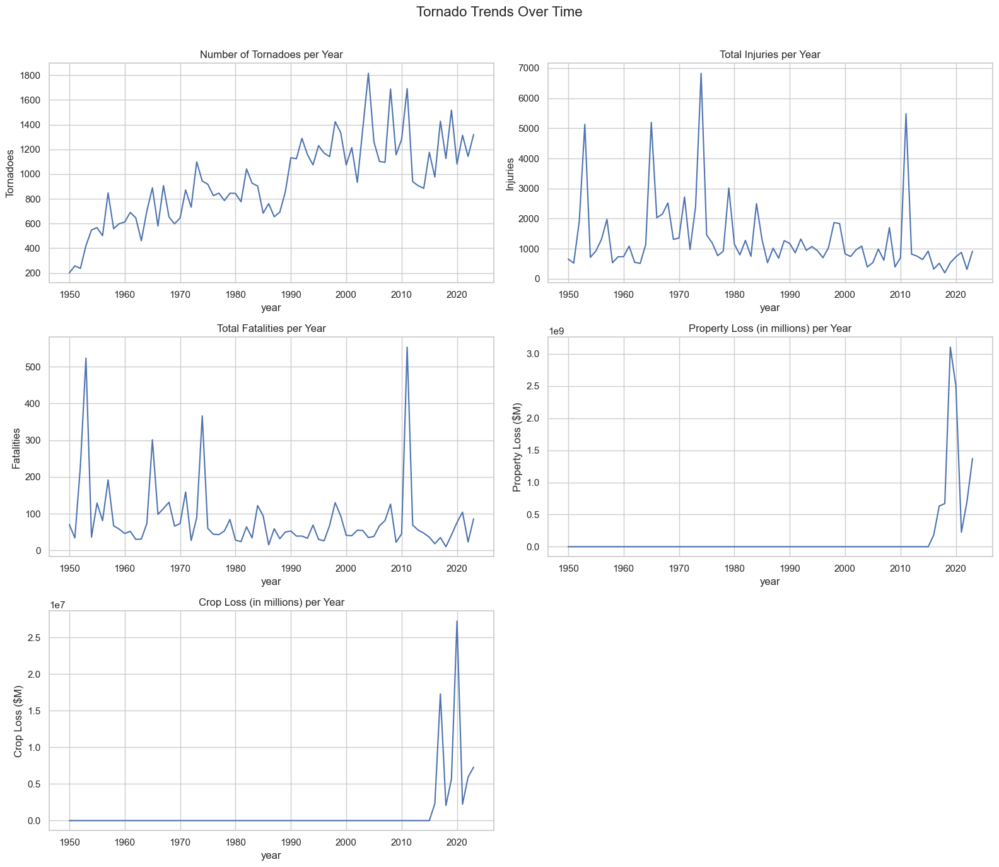

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for plots
sns.set(style="whitegrid")

# Group by year for trend analysis
yearly_data = df.groupby("year").agg({
    "ef-scale": "count",
    "injuries": "sum",
    "fatatalies": "sum",
    "property_loss-millions": "sum",
    "crop_loss-millions": "sum"
}).rename(columns={"ef-scale": "tornado_count"})

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle("Tornado Trends Over Time", fontsize=16)

# Tornado count
sns.lineplot(data=yearly_data, x=yearly_data.index, y="tornado_count", ax=axs[0, 0])
axs[0, 0].set_title("Number of Tornadoes per Year")
axs[0, 0].set_ylabel("Tornadoes")

# Injuries
sns.lineplot(data=yearly_data, x=yearly_data.index, y="injuries", ax=axs[0, 1])
axs[0, 1].set_title("Total Injuries per Year")
axs[0, 1].set_ylabel("Injuries")

# Fatalities
sns.lineplot(data=yearly_data, x=yearly_data.index, y="fatatalies", ax=axs[1, 0])
axs[1, 0].set_title("Total Fatalities per Year")
axs[1, 0].set_ylabel("Fatalities")

# Property loss
sns.lineplot(data=yearly_data, x=yearly_data.index, y="property_loss-millions", ax=axs[1, 1])
axs[1, 1].set_title("Property Loss (in millions) per Year")
axs[1, 1].set_ylabel("Property Loss ($M)")

# Crop loss
sns.lineplot(data=yearly_data, x=yearly_data.index, y="crop_loss-millions", ax=axs[2, 0])
axs[2, 0].set_title("Crop Loss (in millions) per Year")
axs[2, 0].set_ylabel("Crop Loss ($M)")

# Hide empty subplot
axs[2, 1].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


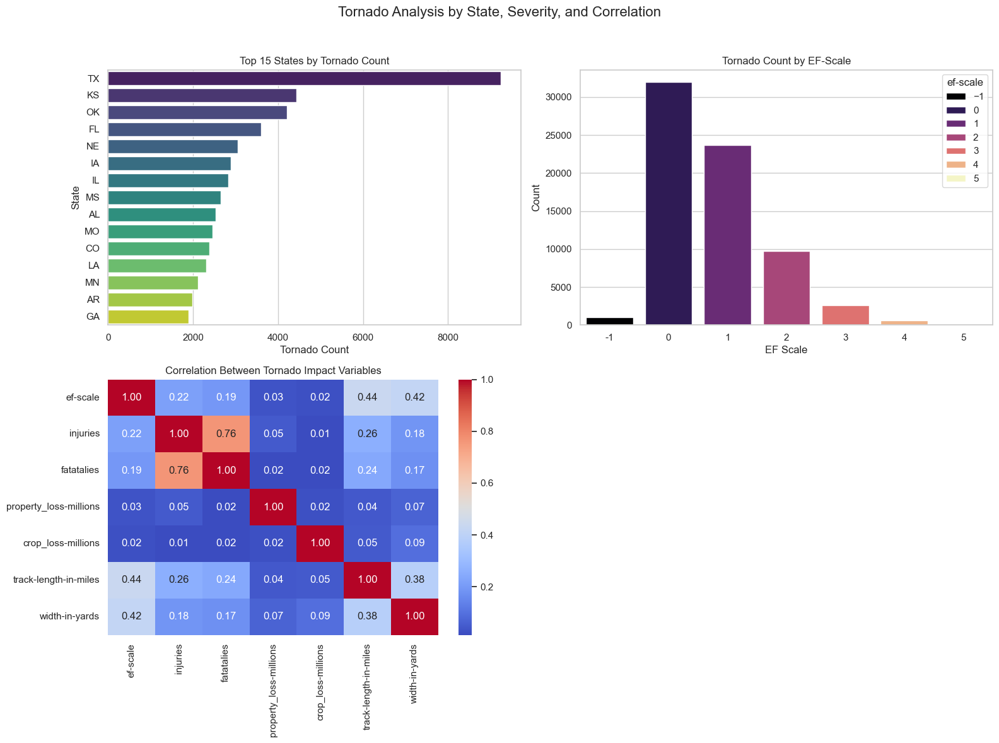

In [71]:
# State-level tornado count
state_counts = df['state'].value_counts().head(15)

# EF-scale distribution
ef_distribution = df['ef-scale'].value_counts().sort_index()

# Correlation matrix for key continuous variables
corr_columns = [
    'ef-scale', 'injuries', 'fatatalies',
    'property_loss-millions', 'crop_loss-millions',
    'track-length-in-miles', 'width-in-yards'
]
corr_matrix = df[corr_columns].corr()

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Tornado Analysis by State, Severity, and Correlation", fontsize=16)

# Top states with most tornadoes
sns.barplot(x=state_counts.values, y=state_counts.index, ax=axs[0, 0], palette="viridis", hue=state_counts.index)
axs[0, 0].set_title("Top 15 States by Tornado Count")
axs[0, 0].set_xlabel("Tornado Count")
axs[0, 0].set_ylabel("State")

# EF-scale distribution
sns.barplot(x=ef_distribution.index, y=ef_distribution.values, ax=axs[0, 1], palette="magma", hue=ef_distribution.index) 
axs[0, 1].set_title("Tornado Count by EF-Scale")
axs[0, 1].set_xlabel("EF Scale")
axs[0, 1].set_ylabel("Count")

# Correlation heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", ax=axs[1, 0])
axs[1, 0].set_title("Correlation Between Tornado Impact Variables")

# Hide unused subplot
axs[1, 1].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


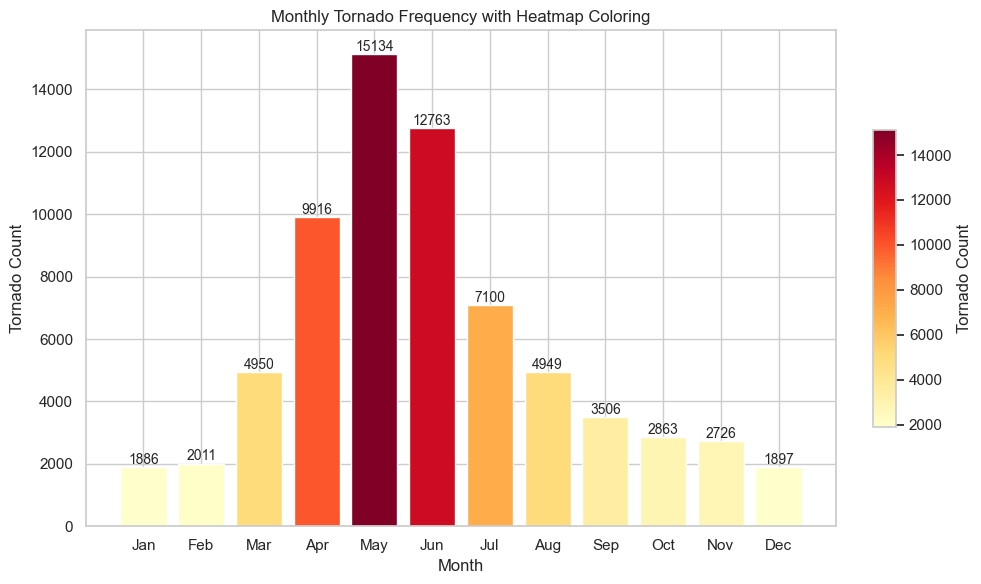

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# Monthly tornado count
monthly_counts = df.groupby("month")["ef-scale"].count().reindex(range(1, 13))

# Create a color palette based on tornado counts
colors = sns.color_palette("YlOrRd", as_cmap=True)
norm = plt.Normalize(monthly_counts.min(), monthly_counts.max())
bar_colors = [colors(norm(val)) for val in monthly_counts]

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(range(1, 13), monthly_counts.values, color=bar_colors)

# Add count labels
for i, val in enumerate(monthly_counts.values):
    plt.text(i + 1, val + 2, str(val), ha='center', va='bottom', fontsize=10)

# Customize axes
plt.title("Monthly Tornado Frequency with Heatmap Coloring")
plt.xlabel("Month")
plt.ylabel("Tornado Count")
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                                       "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap="YlOrRd"), label="Tornado Count", cax=plt.gca().inset_axes([1.05, 0.2, 0.03, 0.6]))

plt.tight_layout()
plt.show()


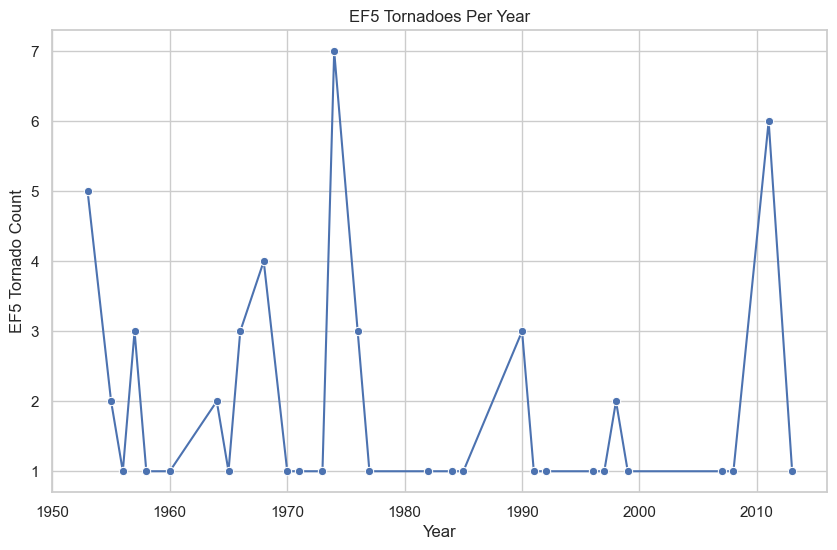

In [73]:
# Filter EF5 tornadoes
ef5_df = df[df["ef-scale"] == 5]

# EF5 count by year
ef5_by_year = ef5_df["year"].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 6))
sns.lineplot(x=ef5_by_year.index, y=ef5_by_year.values, marker="o")
plt.title("EF5 Tornadoes Per Year")
plt.xlabel("Year")
plt.ylabel("EF5 Tornado Count")
plt.grid(True)
plt.show()


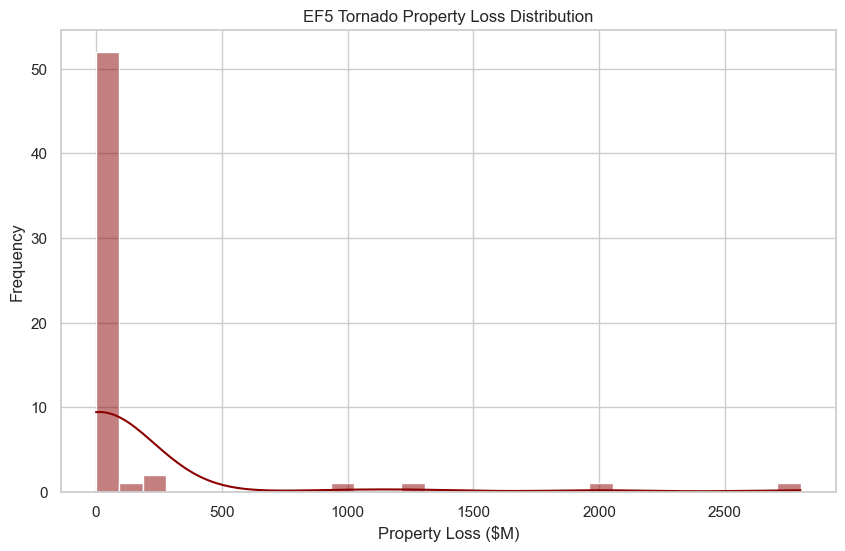

In [74]:
# Histogram of EF5 property loss
plt.figure(figsize=(10, 6))
sns.histplot(ef5_df["property_loss-millions"], bins=30, kde=True, color="darkred")
plt.title("EF5 Tornado Property Loss Distribution")
plt.xlabel("Property Loss ($M)")
plt.ylabel("Frequency")
plt.show()


In [75]:
# import plotly.express as px

# # Basic cleanup: remove rows with missing coordinates
# df_clean = df.dropna(subset=["start_latitude", "start_longitude", "ef-scale"])

# # Plot using Plotly
# fig = px.scatter_geo(
#     df_clean,
#     lat="start_latitude",
#     lon="start_longitude",
#     color="ef-scale",
#     title="Tornado Start Locations Across the U.S.",
#     scope="usa",
#     hover_name="state",
#     hover_data=["year", "month", "ef-scale", "injuries", "fatatalies"],
#     color_continuous_scale="OrRd",
#     opacity=0.5,
#     height=600
# )

# fig.update_layout(geo=dict(
#     landcolor="rgb(217, 217, 217)",
#     lakecolor="rgb(255, 255, 255)",
#     showland=True,
#     showcountries=True,
# ))

# fig.show()


In [76]:
import plotly.express as px

# Clean dataset
df_clean = df.dropna(subset=["start_latitude", "start_longitude", "year", "ef-scale"])

# Optional: Filter to reduce clutter (e.g., only EF2+ or recent years)
# df_clean = df_clean[df_clean["ef-scale"] >= 2]
# df_clean = df_clean[df_clean["year"] >= 1990]

# Animated map
fig = px.scatter_geo(
    df_clean,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-scale",
    animation_frame="year",
    scope="usa",
    hover_name="state",
    hover_data=["month", "ef-scale", "injuries", "fatatalies"],
    color_continuous_scale="OrRd",
    title="Animated Tornado Starting Points by Year 1950-2023",
    opacity=0.5,
    height=600
)

fig.update_layout(geo=dict(
    landcolor="rgb(217, 217, 217)",
    lakecolor="rgb(255, 255, 255)",
    showland=True,
    showcountries=True,
))

fig.show()


In [77]:
# Ensure 'month' column is int (if it's a string, convert it first)
df["month"] = df["month"].astype(int)

# Create a new column combining year and month
df["year_month"] = df["year"].astype(str) + "-" + df["month"].apply(lambda x: f"{x:02d}")


In [78]:
import plotly.express as px

# Drop rows with missing lat/lon or year_month
df_anim = df.dropna(subset=["start_latitude", "start_longitude", "year_month", "ef-scale"])

# Optional: Filter to reduce clutter (e.g., only EF2+ tornadoes)
# df_anim = df_anim[df_anim["ef-scale"] >= 2]

# Create animation
fig = px.scatter_geo(
    df_anim,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-scale",
    animation_frame="year_month",
    scope="usa",
    hover_name="state",
    hover_data=["ef-scale", "injuries", "fatatalies"],
    color_continuous_scale="Turbo",
    title="Tornadoes in the U.S. by Year and Month (1950-2023)",
    opacity=0.6,
    height=600
)

fig.update_geos(
    landcolor="lightgray",
    showcountries=True,
    showland=True
)

fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    geo=dict(showframe=False),
)

fig.show()


In [79]:
import plotly.express as px

# Ensure 'month' column is int and create a year-month column
df["month"] = df["month"].astype(int)
df["year_month"] = df["year"].astype(str) + "-" + df["month"].apply(lambda x: f"{x:02d}")

# Filter for EF3 to EF5 tornadoes
strong_df = df[
    (df["ef-scale"].between(3, 5)) &
    df["start_latitude"].notnull() &
    df["start_longitude"].notnull()
]

# Animated scatter geo map
fig = px.scatter_geo(
    strong_df,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-scale",
    animation_frame="year_month",
    scope="usa",
    hover_name="state",
    hover_data=["ef-scale", "injuries", "fatatalies", "property_loss-millions"],
    color_continuous_scale="Inferno",
    title="EF3 to EF5 Tornadoes in the U.S. (Monthly Animation)",
    opacity=0.7,
    height=650
)

# Map styling
fig.update_geos(
    landcolor="lightgray",
    showland=True,
    showcountries=True
)

fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    geo=dict(showframe=False),
)

fig.show()


In [80]:
# Group tornado count per state per year
state_year_counts = df.groupby(["state", "year"])["ef-scale"].count().reset_index()
state_year_counts.rename(columns={"ef-scale": "tornado_count"}, inplace=True)


In [81]:
import plotly.express as px

fig = px.choropleth(
    state_year_counts,
    locations="state",  # Use state abbreviations (e.g., TX, OK)
    locationmode="USA-states",
    color="tornado_count",
    animation_frame="year",
    color_continuous_scale="Reds",
    scope="usa",
    title="Tornado Counts by U.S. State (Animated by Year)",
    labels={"tornado_count": "Tornado Count"},
    height=650
)

fig.update_layout(
    geo=dict(showframe=False, showcoastlines=False),
    margin={"r":0,"t":50,"l":0,"b":0}
)

fig.show()


In [82]:
# Group by state and year to count tornadoes
state_year_counts = df.groupby(["year", "state"]).size().reset_index(name="tornado_count")


In [83]:
import plotly.express as px

# Plotting animated choropleth
fig = px.choropleth(
    state_year_counts,
    locations="state",                # State abbreviations (e.g., TX, OK)
    locationmode="USA-states",
    color="tornado_count",
    animation_frame="year",
    color_continuous_scale="YlOrRd",
    range_color=(0, state_year_counts["tornado_count"].max()),
    scope="usa",
    title="Tornado Counts by U.S. State (Animated by Year)",
    labels={"tornado_count": "Tornado Count"}
)

fig.update_layout(
    geo=dict(
        lakecolor="lightblue",
        showland=True,
        landcolor="lightgray"
    ),
    height=600
)

fig.show()


In [84]:
import pandas as pd
import plotly.express as px

# Load the data
df = pd.read_csv("tornado-data-cleaned.csv")

# Filter for Oklahoma
ok_df = df[df["state"] == "OK"].copy()

# Replace EF 0 with 0.1 for visibility in heatmap
ok_df["ef-scale"] = ok_df["ef-scale"].replace(0, 0.1)

# Create year-month string, then sort
ok_df["year_month"] = (
    ok_df["year"].astype(int).astype(str) + "-" + ok_df["month"].astype(int).astype(str).str.zfill(2)
)
ok_df = ok_df.sort_values(by=["year", "month"])

# Count tornadoes per year_month
counts = ok_df["year_month"].value_counts().to_dict()
ok_df["count_label"] = ok_df["year_month"].map(lambda ym: f"{ym} ({counts[ym]} tornadoes)")

# Fixed color mapping for EF scale (0 to 5)
ef_colors = {
    0.1: "#c0c0c0",  # Representing EF0 originally 0
    1: "#88cc00",
    2: "#ffcc00",
    3: "#ff8800",
    4: "#ff3300",
    5: "#990000"
}
ok_df["ef-clipped"] = ok_df["ef-scale"].clip(lower=0.1, upper=5).round(0)

# Plot animated density heatmap
fig = px.density_map(
    ok_df,
    lat="start_latitude",
    lon="start_longitude",
    z="ef-clipped",
    radius=10,
    center=dict(lat=35.5, lon=-97.5),
    zoom=6,
    map_style="open-street-map",
    #mapbox_style="carto-positron",
    animation_frame="count_label",
    title="Oklahoma Tornado Intensity Heatmap by Year and Month",
    color_continuous_scale=[
        [0.0, ef_colors[0.1]],
        [0.2, ef_colors[1]],
        [0.4, ef_colors[2]],
        [0.6, ef_colors[3]],
        [0.8, ef_colors[4]],
        [1.0, ef_colors[5]],
    ],
    height=650,
)

fig.update_layout(
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
    coloraxis_colorbar=dict(
        title="EF Scale",
        tickvals=[0.1, 1, 2, 3, 4, 5],
        ticktext=["EF0", "EF1", "EF2", "EF3", "EF4", "EF5"]
    )
)

fig.show()


In [92]:
import pandas as pd
import plotly.express as px

# Load the data
df = pd.read_csv("tornado-data-cleaned.csv")

# Filter for Oklahoma
ok_df = df[df["state"] == "OK"].copy()
ok_df = ok_df.dropna(subset=["start_latitude", "start_longitude", "ef-scale", "year", "month"])
# Create year-month label
ok_df["year_month"] = (
    ok_df["year"].astype(int).astype(str) + "-" +
    ok_df["month"].astype(int).astype(str).str.zfill(2)
)
ok_df = ok_df.sort_values(by=["year", "month"])

# Count per month for annotation
counts = ok_df["year_month"].value_counts().to_dict()
ok_df["count_label"] = ok_df["year_month"].map(lambda ym: f"{ym} ({counts[ym]} tornadoes)")

# Clip EF scale between 0 and 5
ok_df["ef-clipped"] = ok_df["ef-scale"].clip(lower=0, upper=5).round(0)

# Fixed color map for EF scale
ef_colors = {
    0: "#c0c0c0",  # EF0
    1: "#88cc00",
    2: "#ffcc00",
    3: "#ff8800",
    4: "#ff3300",
    5: "#990000"
}

# Create animated scatter map
fig = px.scatter_map(
    ok_df,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-clipped",
    animation_frame="count_label",
    color_discrete_map={k: v for k, v in ef_colors.items()},
    zoom=5.5,
    center={"lat": 35.5, "lon": -97.5},
    height=650,
    map_style="dark",
    title="Oklahoma Tornado Start Locations by Year and Month (EF Scale)"
)

#fig.update_layout(mapbox_style="carto-positron")
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load the data
df = pd.read_csv("tornado-data-cleaned.csv")

# Filter for Oklahoma
ok_df = df[df["state"] == "OK"].copy()

# Create year-month label
ok_df["year_month"] = (
    ok_df["year"].astype(int).astype(str) + "-" +
    ok_df["month"].astype(int).astype(str).str.zfill(2)
)
ok_df = ok_df.sort_values(by=["year", "month"])

# Count per month for annotation
counts = ok_df["year_month"].value_counts().to_dict()
ok_df["count_label"] = ok_df["year_month"].map(lambda ym: f"{ym} ({counts[ym]} tornadoes)")

# Clip EF scale and convert to string for categorical coloring
ok_df["ef-clipped"] = ok_df["ef-scale"].clip(lower=0, upper=5).round(0).astype(int)
ok_df["ef-category"] = ok_df["ef-clipped"].map({
    0: "EF0",
    1: "EF1",
    2: "EF2",
    3: "EF3",
    4: "EF4",
    5: "EF5"
})

# Fixed color mapping
ef_colors = {
    "EF0": "#c0c0c0",
    "EF1": "#88cc00",
    "EF2": "#ffcc00",
    "EF3": "#ff8800",
    "EF4": "#ff3300",
    "EF5": "#990000"
}

# Ensure all EF categories are present in the legend (add dummy rows)
legend_df = pd.DataFrame({
    "start_latitude": [None] * len(ef_colors),
    "start_longitude": [None] * len(ef_colors),
    "ef-category": list(ef_colors.keys()),
    "count_label": [ok_df["count_label"].iloc[0]] * len(ef_colors)
})

ok_df = pd.concat([ok_df, legend_df], ignore_index=True)

# Plot
fig = px.scatter_map(
    ok_df,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-category",
    animation_frame="count_label",       
    color_discrete_map=ef_colors,
    category_orders={"ef-category": list(ef_colors.keys())},
    zoom=6,
    center={"lat": 35.5, "lon": -97.5},
    height=650,
    title="Oklahoma Tornado Start Locations by Year and Month (EF Scale)"
)

fig.update_layout(
    map_style="dark",
    legend_title="EF Rating",
    legend=dict(traceorder="normal")
)

fig.show()


In [103]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import json
import requests

# Load tornado data
df = pd.read_csv("tornado-data-cleaned.csv")
ok_df = df[df["state"] == "OK"].copy()
ok_df = ok_df.dropna(subset=["start_latitude", "start_longitude", "ef-scale", "year", "month"])
# Create year-month label
ok_df["year_month"] = (
    ok_df["year"].astype(str) + "-" +
    ok_df["month"].astype(int).astype(str).str.zfill(2)
)
ok_df = ok_df.sort_values(by=["year", "month"])

# Count per frame for labels
counts = ok_df["year_month"].value_counts().to_dict()
ok_df["count_label"] = ok_df["year_month"].map(lambda ym: f"{ym} ({counts[ym]} tornadoes)")

# Clip EF scale and convert to labeled category
ok_df["ef-clipped"] = ok_df["ef-scale"].clip(lower=0, upper=5).round(0).astype(int)
ok_df["ef-category"] = ok_df["ef-clipped"].map({
    0: "EF0", 1: "EF1", 2: "EF2", 3: "EF3", 4: "EF4", 5: "EF5"
})

# Fixed EF color mapping
ef_colors = {
    "EF0": "#c0c0c0",
    "EF1": "#88cc00",
    "EF2": "#ffcc00",
    "EF3": "#ff8800",
    "EF4": "#ff3300",
    "EF5": "#990000"
}

# Ensure legend is fixed by adding dummy points for all EF categories
legend_df = pd.DataFrame({
    "start_latitude": [None] * len(ef_colors),
    "start_longitude": [None] * len(ef_colors),
    "ef-category": list(ef_colors.keys()),
    "count_label": [ok_df["count_label"].iloc[0]] * len(ef_colors)
})
ok_df = pd.concat([ok_df, legend_df], ignore_index=True)

# Download Oklahoma counties GeoJSON
geo_url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
counties_geojson = requests.get(geo_url).json()

# Oklahoma FIPS prefix is '40'
oklahoma_counties = {
    "type": "FeatureCollection",
    "features": [f for f in counties_geojson["features"] if f["properties"]["STATE"] == "40"]
}

# Plot
fig = px.scatter_map(
    ok_df,
    lat="start_latitude",
    lon="start_longitude",
    color="ef-category",
    animation_frame="count_label",
    color_discrete_map=ef_colors,
    category_orders={"ef-category": list(ef_colors.keys())},
    zoom=6,
    center={"lat": 35.5, "lon": -97.5},
    height=625,
    title="Oklahoma Tornado Start Locations by Year and Month (EF Scale)"
)

# Dark map style + county outlines
fig.update_layout(
    map_style="dark",
    mapbox_layers=[
        {
            "source": oklahoma_counties,
            "type": "line",
            "color": "white",
            "line": {"width": 1},
        }
    ],
    legend_title="EF Rating",
    legend=dict(traceorder="normal", bgcolor="rgba(0,0,0,0.5)", font=dict(color="white")),
    font=dict(color="white"),
    paper_bgcolor="black",
    plot_bgcolor="black"
)

fig.show()


C:\Users\lmark\AppData\Local\Temp\ipykernel_10536\1745238203.py:45: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [86]:
import pandas as pd
import plotly.graph_objects as go
import datetime

# Load and filter the data
df = pd.read_csv("tornado-data-cleaned.csv")

# Filter for OK and EF3+
df = df[(df["state"] == "OK") & (df["ef-scale"] >= 3)]

# Keep only past 30 years
recent_cutoff = datetime.datetime.now().year - 30
df = df[df["year"] >= recent_cutoff]

# Combine date & time for tooltip
#df["datetime"] = pd.to_datetime(df[["date", "time"]], errors="coerce")
df["hover_text"] = (
    "Date: " + df["date"].astype(str) + "<br>" +
    "EF Rating: " + df["ef-scale"].astype(str) + "<br>" +
    "Track Length: " + df["track-length-in-miles"].astype(str) + " miles"
)

# Build figure
fig = go.Figure()

# Plot each tornado as a line (path from start to end)
for _, row in df.iterrows():
    fig.add_trace(go.Scattermapbox(
        mode="lines+markers",
        lon=[row["start_longitude"], row["end_longitude"]],
        lat=[row["start_latitude"], row["end_latitude"]],
        text=row["hover_text"],
        hoverinfo="text",
        marker=dict(size=5, color="#ff3300"),
        line=dict(width=2, color="#ff3300"),
        name=f"EF{int(row['ef-scale'])}"
    ))

# Layout
fig.update_layout(
    mapbox=dict(
        style="carto-darkmatter",
        center={"lat": 35.5, "lon": -97.5},
        zoom=6
    ),
    title=f"EF3+ Tornado Paths in Oklahoma (Last 30 Years)",
    showlegend=False,
    height=700,
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.show()


C:\Users\lmark\AppData\Local\Temp\ipykernel_10536\3956829314.py:28: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [95]:
import pandas as pd
import plotly.graph_objects as go
import datetime

# Load and filter data
df = pd.read_csv("tornado-data-cleaned.csv")
df = df[(df["state"] == "OK") & (df["ef-scale"] >= 3)]

# Filter for the past 30 years
recent_cutoff = datetime.datetime.now().year - 30
df = df[df["year"] >= recent_cutoff]

# Tooltip text using date and time
df["hover_text"] = (
    "Date: " + df["date"].astype(str) + "<br>" +
    "Time: " + df["time"].astype(str) + "<br>" +
    "EF Rating: " + df["ef-scale"].astype(str) + "<br>" +
    "Track Length: " + df["track-length-in-miles"].astype(str) + " miles"
)

# Define EF scale colors
ef_colors = {
    3: "#FFA500",  # Orange
    4: "#FF4500",  # Orange-Red
    5: "#FF0000",  # Red
}

# Plot paths with color by EF scale
fig = go.Figure()

for _, row in df.iterrows():
    ef = int(row["ef-scale"])
    color = ef_colors.get(ef, "#FFFFFF")  # fallback to white if something's off
    fig.add_trace(go.Scattermapbox(
        mode="lines+markers",
        lon=[row["start_longitude"], row["end_longitude"]],
        lat=[row["start_latitude"], row["end_latitude"]],
        text=row["hover_text"],
        hoverinfo="text",
        marker=dict(size=5, color=color),
        line=dict(width=2, color=color),
        name=f"EF{ef}"
    ))

# Layout with dark map
fig.update_layout(
    mapbox=dict(
        style="carto-darkmatter",
        center={"lat": 35.5, "lon": -97.5},
        zoom=5.5
    ),
    title="EF3+ Tornado Paths in Oklahoma (Last 30 Years)",
    showlegend=False,
    height=600,
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.show()


C:\Users\lmark\AppData\Local\Temp\ipykernel_10536\496218136.py:34: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

